# Segmentation of Indian Traffic

# Preliminary

## Loading libraries

In [1]:
import math
from PIL import Image, ImageDraw
from PIL import ImagePath
import pandas as pd
import os
from os import path
from tqdm import tqdm
import json
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import urllib
import urllib.request

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [4]:
#uninstalling keras for complete tensorflow backend
!pip uninstall keras --y

Uninstalling Keras-2.4.3:
  Successfully uninstalled Keras-2.4.3


In [ ]:
!pip install tensorflow==2.2.0

In [ ]:
#unzipping the data
!unzip 'data.zip'

## Structure of Data

<pre>
|--- data
|-----| ---- images
|-----| ------|----- Scene 1
|-----| ------|--------| ----- Frame 1 (image 1)
|-----| ------|--------| ----- Frame 2 (image 2)
|-----| ------|--------| ----- ...
|-----| ------|----- Scene 2
|-----| ------|--------| ----- Frame 1 (image 1)
|-----| ------|--------| ----- Frame 2 (image 2)
|-----| ------|--------| ----- ...
|-----| ------|----- .....
|-----| ---- masks
|-----| ------|----- Scene 1
|-----| ------|--------| ----- json 1 (labeled objects in image 1)
|-----| ------|--------| ----- json 2 (labeled objects in image 1)
|-----| ------|--------| ----- ...
|-----| ------|----- Scene 2
|-----| ------|--------| ----- json 1 (labeled objects in image 1)
|-----| ------|--------| ----- json 2 (labeled objects in image 1)
|-----| ------|--------| ----- ...
|-----| ------|----- .....
</pre>

# Preprocessing

## Getting all the image and json file paths

In [1]:
def return_file_names_df(root_dir):
    '''
    Function to get the image paths and their json file paths
    '''
    
    #the structure is such that for every folder in images there is a subfolder with some number and there are some images in that
    #folder, so we will extract all the paths for images and their mask json files
    path_image = root_dir + '/images'
    image_sub_folders = os.listdir(path_image)

    images = []
    json = []

    for image in image_sub_folders:
        for ele in os.listdir(os.path.join(path_image, image)):
            images.append(os.path.join(path_image, image, ele))

    #for the paths of images obtained, we'll replace the portion after the first _ of the path of image
    #and add '_gtFine_polygons.json' to it
    #also replacing the images/ with mask/
    #this will give us our json file path
    for ele in images:
        ele = ele.replace('/images/', '/mask/')
        json_file_name = ele.split('_')[0] + '_gtFine_polygons.json'
        json.append(json_file_name)

    data_df = pd.DataFrame({'image': images, 'json': json})

    return data_df

In [8]:
data_df = return_file_names_df('data')
data_df.head()

,image,json
0,data/images/316/frame12866_leftImg8bit.jpg,data/mask/316/frame12866_gtFine_polygons.json
1,data/images/316/frame21241_leftImg8bit.jpg,data/mask/316/frame21241_gtFine_polygons.json
2,data/images/316/frame25350_leftImg8bit.jpg,data/mask/316/frame25350_gtFine_polygons.json
3,data/images/316/frame22116_leftImg8bit.jpg,data/mask/316/frame22116_gtFine_polygons.json
4,data/images/316/frame12189_leftImg8bit.jpg,data/mask/316/frame12189_gtFine_polygons.json


> If we observe the dataframe, we can consider each row as single data point, where first feature is image and the second feature is corresponding json file

## Structure of sample Json file

<img src='https://i.imgur.com/EfR5KmI.png' width="200" height="100">

* Each File will have 3 attributes
    * imgHeight: which tells the height of the image
    * imgWidth: which tells the width of the image
    * objects: it is a list of objects, each object will have multiple attributes,
        * label: the type of the object
        * polygon: a list of two element lists, representing the coordinates of the polygon

#### Checking unique labels

Let's see how many unique objects are there in the json file.

In [12]:
def return_unique_labels(data_df):

    unique_labels = set()

    for json_file_path in data_df.json:

        with open(json_file_path, 'r') as f:

            object_dict = json.load(f)['objects']

            for labels in object_dict:
                unique_labels.add(labels['label'])

    return list(unique_labels)

In [13]:
unique_labels = return_unique_labels(data_df)

<img src='https://i.imgur.com/L4QH6Tp.png'>

Here, instead of taking all the labels individually, we will subgroup these labels into 21 groups, so as to reduce the number of segments in the image.

In [14]:
label_clr = {'road':10, 'parking':20, 'drivable fallback':20,'sidewalk':30,'non-drivable fallback':40,'rail track':40,\
                        'person':50, 'animal':50, 'rider':60, 'motorcycle':70, 'bicycle':70, 'autorickshaw':80,\
                        'car':80, 'truck':90, 'bus':90, 'vehicle fallback':90, 'trailer':90, 'caravan':90,\
                        'curb':100, 'wall':100, 'fence':110,'guard rail':110, 'billboard':120,'traffic sign':120,\
                        'traffic light':120, 'pole':130, 'polegroup':130, 'obs-str-bar-fallback':130,'building':140,\
                        'bridge':140,'tunnel':140, 'vegetation':150, 'sky':160, 'fallback background':160,'unlabeled':0,\
                        'out of roi':0, 'ego vehicle':170, 'ground':180,'rectification border':190,\
                   'train':200}

## Extracting the polygons from the json files

In [16]:
def get_poly(file):
    # this function will take a file name as argument
    # it will process all the objects in that file and returns
    # label: a list of labels for all the objects label[i] will have the corresponding vertices in vertexlist[i]
    # len(label) == number of objects in the image
    # vertexlist: it should be list of list of vertices in tuple formate
    # ex: [[(x11,y11), (x12,y12), (x13,y13) .. (x1n,y1n)]
    #     [(x21,y21), (x22,y12), (x23,y23) .. (x2n,y2n)]
    #      .....
    #     [(xm1,ym1), (xm2,ym2), (xm3,ym3) .. (xmn,ymn)]]
    # len(vertexlist) == number of objects in the image
    with open(file, 'r') as f:

        json_file = json.load(f)

        h = json_file['imgHeight']
        w = json_file['imgWidth']
        json_objects = json_file['objects']

        label = []
        vertexlist = []
        for obj in json_objects:

            labels = obj['label']
            list_of_vertices = obj['polygon']
            list_of_vertices = list(map(tuple, list_of_vertices))

            label.append(obj['label'])
            vertexlist.append(list_of_vertices)
            
    return w, h, label, vertexlist


## Creating Image segmentations by drawing set of polygons

In [19]:
def compute_masks(data_df):
    # after we have computed the vertexlist, we need to plot that polygon in image

    paths = []
    if not os.path.isdir('data/output'):
        os.mkdir('data/output')

    for _, row in data_df.iterrows():

        json_file_path = row.json
        #getting the w, h, labels, and vertices
        w, h, labels, vertices = get_poly(json_file_path)

        #create a new image
        img = Image.new("RGB", size=(w, h))
        img_draw = ImageDraw.Draw(img)

        #now for each of the lable and its corresponding vertices, we will draw it on image
        for label, poly in zip(labels, vertices):
            if len(poly) < 2:
                continue
            img_draw.polygon(poly, fill=label_clr[label])

        #getting the path to save it
        im_save_path = json_file_path.replace('/mask/', '/output/').replace('.json', '.png')
        im_save_dir = '/'.join(im_save_path.split('/')[:3])

        if not os.path.isdir(im_save_dir):
            os.mkdir(im_save_dir)

        #extracting only the first channel of image
        img = np.array(img)
        im = Image.fromarray(img[:, :, 0])
        im.save(im_save_path)
        paths.append(im_save_path)

    data_df['mask'] = paths

    return data_df

In [20]:
data_df = compute_masks(data_df)
data_df.head()

,image,json,mask
0,data/images/316/frame12866_leftImg8bit.jpg,data/mask/316/frame12866_gtFine_polygons.json,data/output/316/frame12866_gtFine_polygons.png
1,data/images/316/frame21241_leftImg8bit.jpg,data/mask/316/frame21241_gtFine_polygons.json,data/output/316/frame21241_gtFine_polygons.png
2,data/images/316/frame25350_leftImg8bit.jpg,data/mask/316/frame25350_gtFine_polygons.json,data/output/316/frame25350_gtFine_polygons.png
3,data/images/316/frame22116_leftImg8bit.jpg,data/mask/316/frame22116_gtFine_polygons.json,data/output/316/frame22116_gtFine_polygons.png
4,data/images/316/frame12189_leftImg8bit.jpg,data/mask/316/frame12189_gtFine_polygons.json,data/output/316/frame12189_gtFine_polygons.png


<b>Sample Image mask</b>

<img src = 'https://i.imgur.com/4XSUlHk.png' width = "400"/>

# Applying Unet to segment the images

<pre>
* <img src='https://i.imgur.com/rD4yP7J.jpg' width="500">

* We won't writing this whole architecture, rather we will be doing transfer learning
</pre>

<font size = 4><b><u>Dice Loss</u>:</b></font>
The core idea of Dice Loss comes from the Dice Score. For image segmentation tasks, we effectively want to calculate the overlap of each predicted pixel with the actual pixel. To quantify this overlap, a metric called Dice Coefficient is often used. <br>
Dice Coefficient can be written as: <br><br>
$Dice Coefficient = 2|A∩B| / (|A|+|B|)$
<br><br>
From the above formula we can see that the numerator expresses the total number of pixel ovelaps between the actual and predicted pixels of a single class, and the denominator represents the sum of the total pixels of actual and predicted segment of same class.<br>
Our goal is to maximize this score.
<br><br>
The Dice loss is inherited from the dice coefficient itself, and in the case of Dice Loss - we try to minimize the $(1-Dice)$ Score.
It is also called as a Soft Dice Loss because instead of using the actual labels, we are use the probability values of the predicted class.<br>
If both the actual and predicted pixels overlap perfectly we get a Dice Score of 1 and a Dice Loss of 0. If they don't overlap at all, the Dice Score Comes out to be 0.
<br>If we analyse it more we see that our ultimate end result is to segment the image as closely as the actual segmentation. This means that we would ideally want a 0 loss which corresponds to perfect overlab.<br>
The numerator of Dice Coefficient denotes the overlap of pixels of predicted and actual class locally, where as the denominator tells about the pixels of each of them on a global scale. Thus this helps us to effectively minimize the loss both locally and globally.<br>
<br>This loss function is better than other loss functions because say if we want to do segmentation of particular object, we would require the boundaries of the predicted and actual to be perfectly overlapping, and this we can achieve using the Dice Loss. <br>
Simple Cross-Entropy fails when there is a huge imabalance between classes as classification/proper identification of the majority class will effectively reduce the loss, but this in no way suggests the model's actual segmentation ability. This is why Dice Loss is preferred over here.





## Importing the libraries

In [ ]:
#installing the segmentation module
!pip install git+https://github.com/qubvel/segmentation_models

In [25]:
import tensorflow as tf
from tensorflow import keras
import segmentation_models as sm
from segmentation_models.metrics import iou_score
from segmentation_models import Unet
from sklearn.model_selection import train_test_split
tf.keras.backend.set_image_data_format('channels_last')
import imgaug.augmenters as iaa
import cv2
os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true'
%load_ext tensorboard
import os
import datetime

Segmentation Models: using `tf.keras` framework.


## Train Test Split

In [26]:
#splitting the data into train and validation
data_train, data_val = train_test_split(data_df, test_size = 0.15, random_state = 33)

## Data Preparation

In [27]:
#defining the augmentors
def augmentors():
    '''
    Function to get the augmentors
    '''
    aug1 = iaa.Fliplr(1)
    aug2 = iaa.DirectedEdgeDetect(alpha=(0.8), direction=(1.0))
    aug3 = iaa.Emboss(alpha=1, strength=1)
    aug4 = iaa.Sharpen(alpha=1, lightness=1)

    return aug1, aug2, aug3, aug4

aug1, aug2, aug3, aug4 = augmentors()

#we need to prepare the dataset now
def normalize_image(img):
    img = img / 255.

class Dataset:

    class_labels = list(set(label_clr.values()))

    def __init__(self, images_paths, training=True, w=512, h=512):

        self.original_image = images_paths.image.values
        self.output_image = images_paths['mask'].values
        self.classes = self.class_labels
        self.w = w
        self.h = h
        self.training = training

    def __getitem__(self, i):

        input_image = cv2.imread(self.original_image[i], cv2.IMREAD_UNCHANGED)
        mask_image = cv2.imread(self.output_image[i], cv2.IMREAD_UNCHANGED)
        input_image = cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB)

        #resizing both the images
        input_image = cv2.resize(input_image, (self.w, self.h),
                                 interpolation=cv2.INTER_AREA)
        mask_image = cv2.resize(mask_image, (self.w, self.h),
                                interpolation=cv2.INTER_AREA)
        
        #image augmentation
        aug_chooser = np.random.uniform(0, 1)

        aug_list = [aug1, aug2, aug3, aug4]

        if aug_chooser < 0.25:
            aug = 0
        elif aug_chooser < 0.5:
            aug = 1
        elif aug_chooser < 0.75:
            aug = 2
        else:
            aug = 3
        
        if self.training:
            input_image = aug_list[aug].augment_image(input_image)
            mask_image = aug_list[aug].augment_image(mask_image)

        #onehotencoding the masked image
        mask_image_onehot = [(mask_image == label) for label in self.classes]
        mask_image_onehot = np.stack(mask_image_onehot,axis=-1).astype('float64')

        #normalizing the values of image
        input_image = input_image / 255.

        return input_image, mask_image_onehot

    def __len__(self):
        return len(self.original_image)

In [28]:
#Now we need to make a datagenerator
class DataLoader(tf.keras.utils.Sequence):
    def __init__(self, dataset, batch_size):
        self.dataset = dataset
        self.batch_size = batch_size

    def __getitem__(self, i):
        # collect batch data
        start = i * self.batch_size
        stop = (i + 1) * self.batch_size
        data = []
        for j in range(start, stop):
            data.append(self.dataset[j])

        batch = [np.stack(sample, axis=0) for sample in zip(*data)]
        return tuple(batch)

    def __len__(self):
        return len(self.indexes) // self.batch_size

In [29]:
train_data = Dataset(data_train)
val_data = Dataset(data_val,training = False)

batch_size = 4
train_dataloader = DataLoader(train_data, batch_size)
val_dataloader = DataLoader(val_data, batch_size)

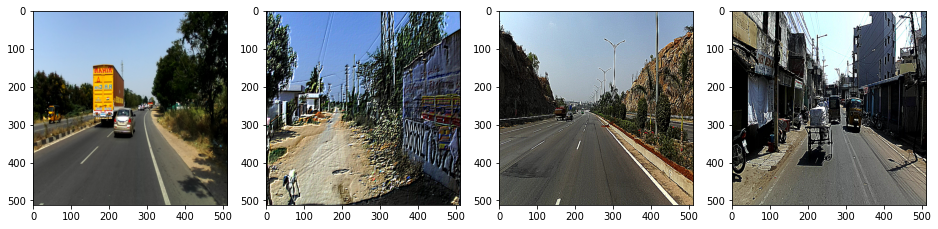

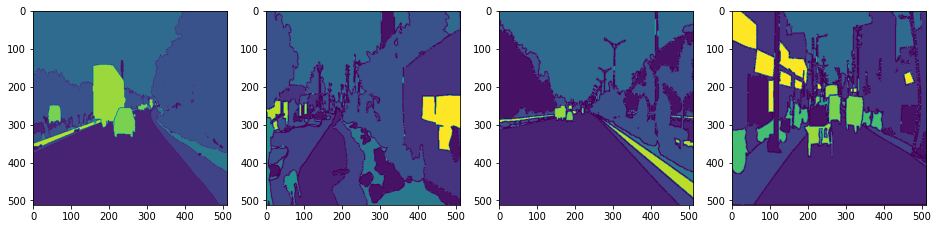

In [ ]:
#lets try to visualize some of the train data pics and their corresponding masks
train_images, mask_images = train_dataloader[35]
plt.figure(figsize=(16, 5))
plt.title("Train Images")
for i in range(4):
    plt.subplot(1, 4, i + 1)
    plt.imshow(train_images[i])
plt.figure(figsize=(16, 5))
plt.title("Train Masks")
for i in range(4):
    plt.subplot(1, 4, i + 1)
    plt.imshow(np.argmax(mask_images[i], axis=-1))

## Training U-NET

In [ ]:
#defining our model
#using unet model with pretrained resnet34 as our encoder
tf.keras.backend.clear_session()

model_unet = Unet('resnet34', 
                  input_shape = (512,512,3),
                  classes = 21,
                  activation = 'softmax',
                  encoder_weights = 'imagenet',
                  encoder_freeze = True)

model_unet.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
data (InputLayer)               [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
bn_data (BatchNormalization)    (None, 512, 512, 3)  9           data[0][0]                       
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 518, 518, 3)  0           bn_data[0][0]                    
__________________________________________________________________________________________________
conv0 (Conv2D)                  (None, 256, 256, 64) 9408        zero_padding2d[0][0]             
____________________________________________________________________________________________

In [ ]:
!rm -rf ./logs/

logdir = os.path.join('logs',datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
%tensorboard --logdir $logdir

<IPython.core.display.Javascript object>

In [ ]:
#defining the loss
loss = sm.losses.categorical_focal_dice_loss
#defining the optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001)
#compiling the model
model_unet.compile(optimizer, loss, metrics = [iou_score])
#defining the callbacks
cb = [tf.keras.callbacks.TensorBoard(logdir, 
                                     histogram_freq = 1, 
                                     write_graph = True),
      
      tf.keras.callbacks.ModelCheckpoint(monitor = 'val_iou_score', 
                                         filepath = 'model_unet.h5',
                                         save_best_only = True), 
      ]

In [ ]:
model_unet.fit(train_dataloader, 
               validation_data = val_dataloader, 
               epochs = 15, 
               steps_per_epoch = len(train_dataloader),
               callbacks = cb)

Epoch 1/15
851/851 [==============================] - 526s 618ms/step - loss: 0.7401 - iou_score: 0.2071 - val_loss: 0.9521 - val_iou_score: 0.0685
Epoch 2/15
851/851 [==============================] - 500s 587ms/step - loss: 0.6420 - iou_score: 0.2900 - val_loss: 0.6114 - val_iou_score: 0.3210
Epoch 3/15
851/851 [==============================] - 499s 586ms/step - loss: 0.6156 - iou_score: 0.3135 - val_loss: 0.5990 - val_iou_score: 0.3315
Epoch 4/15
851/851 [==============================] - 499s 587ms/step - loss: 0.5959 - iou_score: 0.3312 - val_loss: 0.5880 - val_iou_score: 0.3423
Epoch 5/15
851/851 [==============================] - 495s 582ms/step - loss: 0.5841 - iou_score: 0.3419 - val_loss: 0.5729 - val_iou_score: 0.3574
Epoch 6/15
851/851 [==============================] - 495s 582ms/step - loss: 0.5782 - iou_score: 0.3471 - val_loss: 0.5734 - val_iou_score: 0.3559
Epoch 7/15
851/851 [==============================] - 496s 583ms/step - loss: 0.5698 - iou_score: 0.3555 - val_l

In [ ]:
model_unet.optimizer.lr = 0.0005
model_unet.fit(train_dataloader, 
               validation_data = val_dataloader, 
               initial_epoch = 15,
               epochs = 25, 
               steps_per_epoch = len(train_dataloader),
               callbacks = cb)

Epoch 16/25
851/851 [==============================] - 491s 577ms/step - loss: 0.5294 - iou_score: 0.3946 - val_loss: 0.5264 - val_iou_score: 0.4024
Epoch 17/25
851/851 [==============================] - 489s 575ms/step - loss: 0.5224 - iou_score: 0.4016 - val_loss: 0.4900 - val_iou_score: 0.4386
Epoch 18/25
851/851 [==============================] - 491s 577ms/step - loss: 0.5236 - iou_score: 0.4015 - val_loss: 0.4876 - val_iou_score: 0.4416
Epoch 19/25
851/851 [==============================] - 490s 576ms/step - loss: 0.5174 - iou_score: 0.4070 - val_loss: 0.4404 - val_iou_score: 0.4889
Epoch 20/25
851/851 [==============================] - 487s 572ms/step - loss: 0.5150 - iou_score: 0.4098 - val_loss: 0.4396 - val_iou_score: 0.4892
Epoch 21/25
851/851 [==============================] - 491s 576ms/step - loss: 0.5167 - iou_score: 0.4085 - val_loss: 0.4392 - val_iou_score: 0.4904
Epoch 22/25
851/851 [==============================] - 488s 574ms/step - loss: 0.5134 - iou_score: 0.4119 

In [ ]:
#decreasing the learning rate further as we are hitting a plateau

model_unet.optimizer.lr = 0.0001

model_unet.fit(train_dataloader, 
               validation_data = val_dataloader, 
               initial_epoch = 25,
               epochs = 35, 
               steps_per_epoch = len(train_dataloader),
               callbacks = cb)

Epoch 26/35
851/851 [==============================] - 488s 574ms/step - loss: 0.4990 - iou_score: 0.4264 - val_loss: 0.4282 - val_iou_score: 0.5001
Epoch 27/35
851/851 [==============================] - 489s 574ms/step - loss: 0.4935 - iou_score: 0.4310 - val_loss: 0.4276 - val_iou_score: 0.5008
Epoch 28/35
851/851 [==============================] - 488s 574ms/step - loss: 0.4938 - iou_score: 0.4312 - val_loss: 0.4263 - val_iou_score: 0.5016
Epoch 29/35
851/851 [==============================] - 486s 571ms/step - loss: 0.4992 - iou_score: 0.4265 - val_loss: 0.4276 - val_iou_score: 0.5005
Epoch 30/35
851/851 [==============================] - 487s 572ms/step - loss: 0.4951 - iou_score: 0.4301 - val_loss: 0.4269 - val_iou_score: 0.5014
Epoch 31/35
851/851 [==============================] - 486s 571ms/step - loss: 0.4948 - iou_score: 0.4304 - val_loss: 0.4264 - val_iou_score: 0.5020
Epoch 32/35
851/851 [==============================] - 489s 575ms/step - loss: 0.4959 - iou_score: 0.4299 

In [ ]:
#saving the model as h5 file
tf.keras.models.save_model(model_unet, 'model_unet.h5')

## Predicting some of the validation images

In [71]:
def plot_sample_images(model, n=10):
    sample_paths_images = data_val.sample(n)

    for i in range(n):
        plt.figure(figsize=(16, 5))
        original_image, mask_image = Dataset(sample_paths_images,
                                             training=False)[i]
        predicted_image = model.predict(np.expand_dims(original_image, 0))

        images = [
            original_image,
            np.argmax(mask_image, axis=-1),
            np.argmax(predicted_image[0], axis=-1)
        ]
        titles = ["Original Image", "Masked Image", "Model Segmented Image"]
        for j in range(3):
            plt.subplot(1, 3, j + 1)
            plt.title(titles[j])
            plt.imshow(images[j])
            plt.xticks([])
            plt.yticks([])

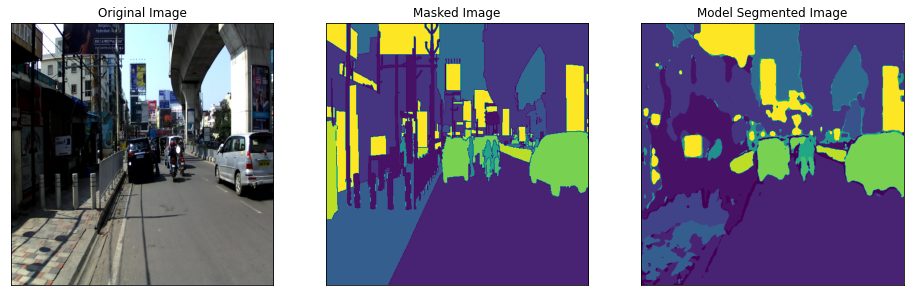

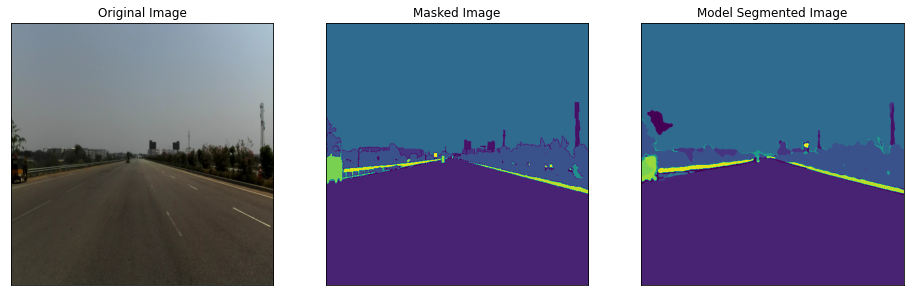

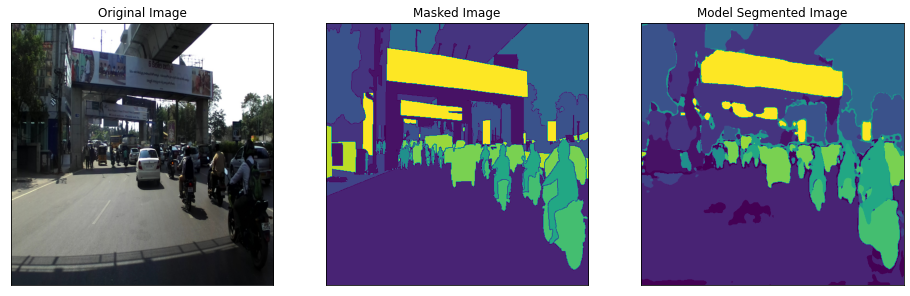

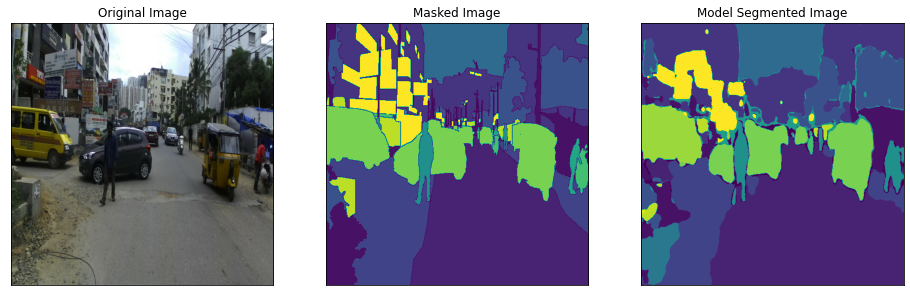

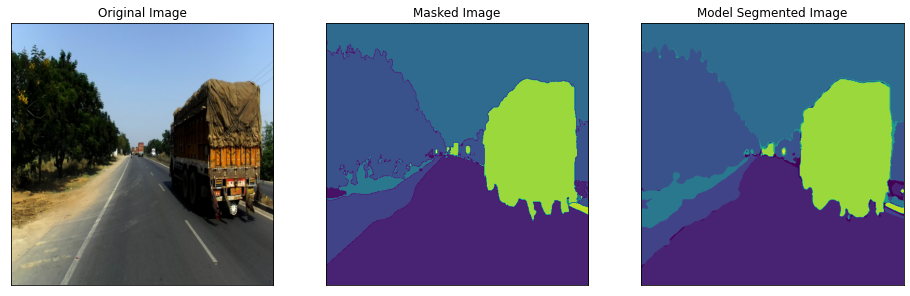

...

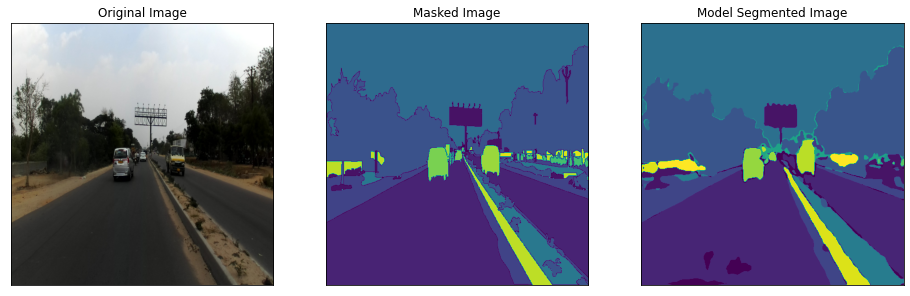

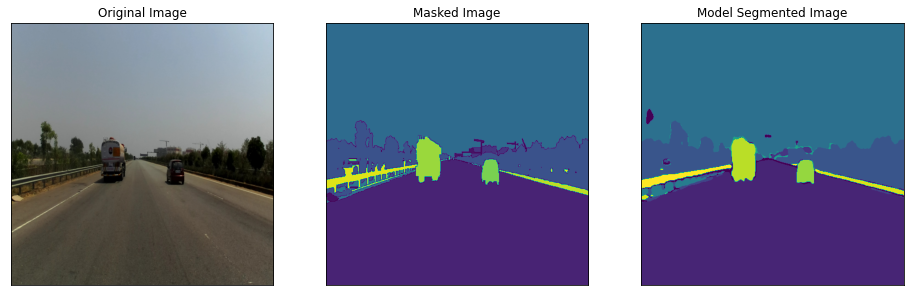

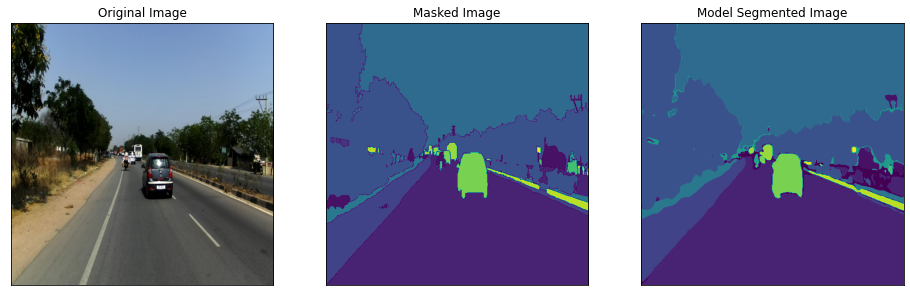

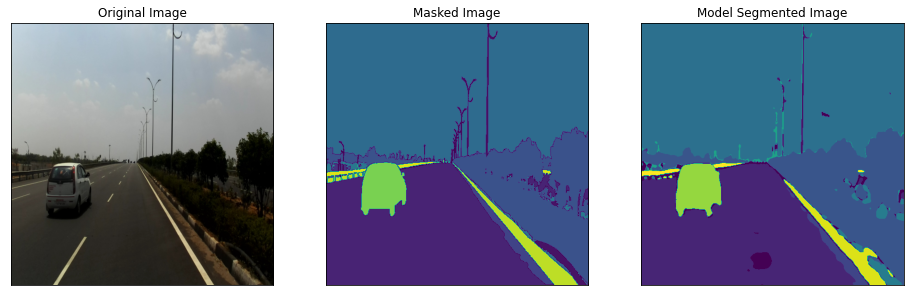

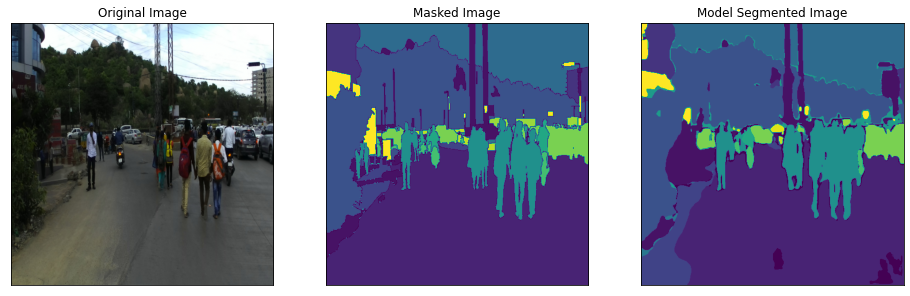

In [ ]:
plot_sample_images(model_unet,20)

## TensorBoard Plots

### Epoch vs IOU Score

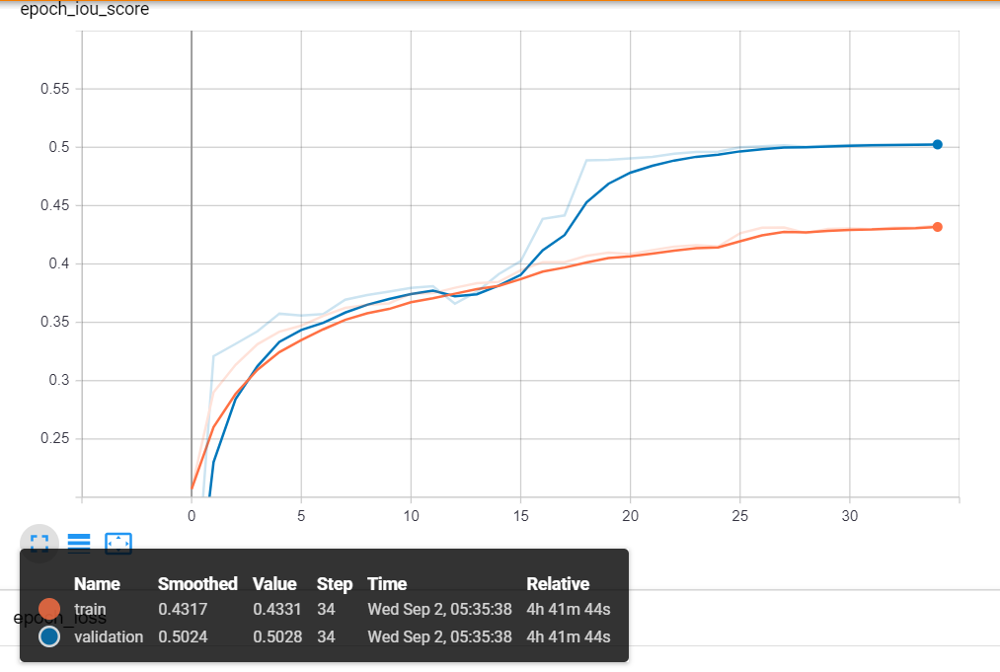

### Epoch vs Loss

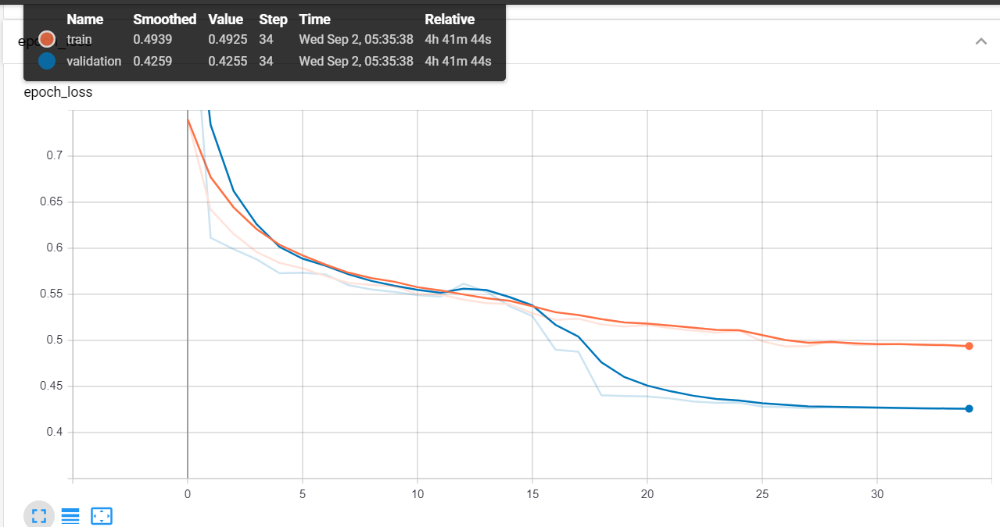

We see that even with so less data, our model is performing really well.

# Using CANet architecture to Segment Images

## Loading Libraries

In [30]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import *
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import UpSampling2D
from tensorflow.keras.layers import MaxPooling2D, GlobalAveragePooling2D
from tensorflow.keras.layers import concatenate
from tensorflow.keras.layers import Multiply
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Input, Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.utils import plot_model
from tensorflow.keras.initializers import glorot_uniform, he_normal, glorot_normal
K.set_image_data_format('channels_last')
K.set_learning_phase(1)

* We will also be implementing the architecture based on this paper https://arxiv.org/pdf/2002.12041.pdf
* We can devide the whole architecture can be devided into two parts
    1. Encoder
    2. Decoder
    <img src='https://i.imgur.com/prH3Mno.png' width="600">
* Encoder:
    * The first step of the encoder is to create the channel maps [$C_1$, $C_2$, $C_3$, $C_4$]
    * $C_1$ width and heigths are 4x times less than the original image
    * $C_2$ width and heigths are 8x times less than the original image
    * $C_3$ width and heigths are 8x times less than the original image
    * $C_4$ width and heigths are 8x times less than the original image
    * [$C_1$, $C_2$, $C_3$, $C_4$] are formed by applying a "conv block" followed by $k$ number of "identity block". i.e the $C_k$ feature map will single "conv block" followed by $k$ number of "identity blocks".
    <table>
    <tr><td><img src="https://i.imgur.com/R8Gdypo.png" width="300"></td>
        <td><img src="https://i.imgur.com/KNunjQK.png" width="250"></td></tr>
    </table>


## Defining the Model Architecture

In [31]:
class convolutional_block(tf.keras.layers.Layer):
    def __init__(self,
                 kernel=3,
                 filters=[4, 4, 8],
                 stride=1,
                 name="conv_block"):
        super().__init__(name=name)
        self.F1, self.F2, self.F3 = filters
        self.kernel = kernel
        self.stride = stride
        self.res = Conv2D(self.F3, (3, 3), self.stride, padding='same')
        self.conv1 = Conv2D(self.F1, (1, 1), padding='same')
        self.conv2 = Conv2D(self.F2, (3, 3), self.stride, padding='same')
        self.conv3 = Conv2D(self.F3, (1, 1), padding='same')
        self.bnr = BatchNormalization()
        self.bn1 = BatchNormalization()
        self.bn2 = BatchNormalization()
        self.bn3 = BatchNormalization()
        self.relu = Activation('relu')

    def call(self, X):

        r = self.res(X)
        r = self.bnr(r)
        r = self.relu(r)

        c = self.conv1(X)
        c = self.bn1(c)
        c = self.relu(c)

        c = self.conv2(c)
        c = self.bn2(c)
        c = self.relu(c)

        c = self.conv3(c)
        c = self.bn3(c)

        X = add([r, c])
        X = self.relu(X)

        return X

In [32]:
class identity_block(tf.keras.layers.Layer):
    def __init__(self, kernel=3, filters=[4, 4, 8], name="identity_block"):
        super().__init__(name=name)
        self.F1, self.F2, self.F3 = filters
        self.kernel = kernel
        self.conv1 = Conv2D(self.F1, (1, 1), padding='same')
        self.conv2 = Conv2D(self.F2, (3, 3), padding='same')
        self.conv3 = Conv2D(self.F3, (1, 1), padding='same')
        self.bn1 = BatchNormalization()
        self.bn2 = BatchNormalization()
        self.bn3 = BatchNormalization()
        self.relu = Activation('relu')

    def call(self, X):

        i = self.conv1(X)
        i = self.bn1(i)
        i = self.relu(i)

        i = self.conv2(i)
        i = self.bn2(i)
        i = self.relu(i)

        i = self.conv3(i)
        i = self.bn3(i)

        X = add([i, X])
        X = self.relu(X)

        return X

* The output of the $C_4$ will be passed to $\text{Chained Context Aggregation Module (CAM)}$
<img src='https://i.imgur.com/Bu63AAA.png' width="400">

In [33]:
class global_flow(tf.keras.layers.Layer):
    def __init__(self, kernel = 64, filters = 64, name="global_flow"):
        super().__init__(name=name)
        self.kernel = kernel
        self.filters = filters
        self.globalavgpool = GlobalAveragePooling2D()
        self.conv = Conv2D(self.filters,
                           (1,1),
                           padding = 'same',
                           activation = 'relu')
        self.upsampling = UpSampling2D(size = (self.kernel,self.kernel),
                                       interpolation = 'bilinear')
        self.bn = BatchNormalization()
        self.relu = Activation('relu')
        
    def call(self, X):

        X = self.globalavgpool(X)
        X = tf.expand_dims(X, axis = 1)
        X = tf.expand_dims(X, axis = 1)
        X = self.bn(X)
        X = self.relu(X)

        X = self.conv(X)
        X = self.upsampling(X)

        return X

In [34]:
class context_flow(tf.keras.layers.Layer):    
    def __init__(self, filters = 32, name="context_flow"):
        super().__init__(name=name)
        self.filters = filters
        self.avgpool2d = AveragePooling2D(strides = 2,
                                          padding = 'same')
        self.conv1 = Conv2D(self.filters,
                            (3,3),
                            padding = 'same',
                            activation = 'relu')
        self.conv2 = Conv2D(self.filters,
                            (3,3),
                            padding = 'same',
                            activation = 'relu')
        self.conv3 = Conv2D(self.filters,
                            (1,1),
                            padding = 'same',
                            activation = 'relu')
        self.conv4 = Conv2D(self.filters,
                            (1,1),
                            padding = 'same')
        self.upsample = UpSampling2D(size  = (2,2),
                                     interpolation = 'bilinear')
        self.relu = Activation('relu')
        self.sigmoid = Activation('sigmoid')


    def call(self, X):
        # here X will a list of two elements 
        INP, FLOW = X[0], X[1] 
        X = concatenate([INP,FLOW])
        X = self.avgpool2d(X)
        
        X = self.conv1(X)
        X = self.conv2(X)
        
        Y = self.conv3(X)
        Y = self.relu(Y)
        Y = self.conv4(Y)
        Y = self.sigmoid(Y)

        X1 = multiply([X,Y])
        X = add([X,X1])

        X = self.upsample(X)
        
        return X

In [35]:
class fsm(tf.keras.layers.Layer):    
    def __init__(self, name="feature_selection", filters = 32):
        super().__init__(name=name)
        self.conv1 = Conv2D(filters,
                            (3,3),
                            padding = 'same')
        self.conv2 = Conv2D(filters,
                            (1,1),
                            padding = 'same')
        self.globalmax2d = GlobalMaxPool2D()
        self.bn = BatchNormalization()
        self.upsample = UpSampling2D(size = (2,2),
                                     interpolation = 'bilinear')
        self.sigmoid = Activation('sigmoid')
        
    def call(self, X):

        X = self.conv1(X)
        
        Y = self.globalmax2d(X)
        Y = tf.expand_dims(Y, axis = 1)
        Y = tf.expand_dims(Y, axis = 1)
        Y = self.conv2(Y)
        Y = self.bn(Y)
        Y = self.sigmoid(Y)

        X = multiply([X,Y])

        FSM_Conv_T = self.upsample(X)

        return FSM_Conv_T

* <b>Adapted Global Convolutional Network (AGCN)</b>:
    <img src="https://i.imgur.com/QNB8RmV.png" width="300">

In [36]:
class agcn(tf.keras.layers.Layer):    
    def __init__(self, name="global_conv_net", filters = 32):
        super().__init__(name=name)
        self.conv1 = Conv2D(filters,
                            (7,1),
                            padding = 'same',
                            activation = 'relu')
        self.conv2 = Conv2D(filters,
                            (1,7),
                            padding = 'same',
                            activation = 'relu')
        self.conv3 = Conv2D(filters,
                            (1,7),
                            padding = 'same',
                            activation = 'relu')
        self.conv4 = Conv2D(filters,
                            (7,1),
                            padding = 'same',
                            activation = 'relu')
        self.conv5 = Conv2D(filters,
                            (3,3),
                            padding = 'same',
                            activation = 'relu')
        
    def call(self, X):

        
        X1 = self.conv1(X)
        X1 = self.conv2(X1)
        
        X2 = self.conv3(X)
        X2 = self.conv4(X2)
        
        X = add([X1,X2])
        Y = self.conv5(X)
        
        X = add([X,Y])

        return X

*     <img src='https://i.imgur.com/prH3Mno.png' width="600">
* As shown in the architecture, after we get the AGCN it will get concatenated with the FSM output

* If we observe the shapes, both AGCN and FSM will have same height and weight

* We will be concatenating both these outputs over the last axis

* The concatenated output will be passed to a conv layers with filters = number of classes in our data set and the activation function = 'relu'

* we will be using padding="same" which results in the same size feature map

* If we observe the shape of matrix, it will be 4x times less than the original image

* to make it equal to the original output shape, we will do 4x times upsampling of rows and columns

* We will apply upsampling with bilinear pooling as interpolation technique.

* Finally we will be applying sigmoid activation.

In [61]:
tf.keras.backend.clear_session()
X_input = Input(shape=(512, 512, 3))

# Stage 1
X = Conv2D(256, (3, 3),
           name='conv1',
           padding="same",
           kernel_initializer=glorot_uniform(seed=0))(X_input)
X = BatchNormalization(axis=3, name='bn_conv1')(X)
X = Activation('relu')(X)
X = MaxPooling2D((2, 2), strides=(2, 2))(X)

#C1 block
X = convolutional_block(filters=[32, 32, 64], stride=2, name='conv_block_1')(X)
C1 = identity_block(filters=[32, 32, 64], name='identity_block_1')(X)

#C2 block

X = convolutional_block(filters=[64, 64, 128], stride=2,
                        name='conv_block_2')(C1)
for i in range(2):
    X = identity_block(filters=[64, 64, 128],
                       name='identity_block_2' + str(i))(X)

#C3 block

X = convolutional_block(filters=[128, 128, 256], stride=1,
                        name='conv_block_3')(X)
for i in range(3):
    X = identity_block(filters=[128, 128, 256],
                       name='identity_block_3' + str(i))(X)

#C4 block

X = convolutional_block(filters=[256, 256, 512], stride=1,
                        name='conv_block_4')(X)
for i in range(4):
    X = identity_block(filters=[256, 256, 512],
                       name='identity_block_4' + str(i))(X)

#flow blocks
GF = global_flow(kernel=X.shape[1], filters=256)(X)

num_filters = GF.shape[-1]
CF1 = context_flow(filters=256, name='context_flow_1')([X, GF])
CF2 = context_flow(filters=256, name='context_flow_2')([X, CF1])
CF3 = context_flow(filters=256, name='context_flow_3')([X, CF2])

X = add([GF, CF1, CF2, CF3])

#FSM
X = fsm(filters=256)(X)

#AGCN and Concat

AGCN = agcn(filters=256)(C1)
X = concatenate([X, AGCN])

#final (3x3) convolution
X = Dropout(0.1)(X)
X = Conv2D(256, (3, 3), padding='same', kernel_initializer=he_normal())(X)
X = Dropout(0.1)(X)
X = BatchNormalization()(X)
X = Activation('relu')(X)
X = Conv2D(21, (3, 3), padding='same')(X)
X = UpSampling2D(size=(4, 4), interpolation='bilinear')(X)
output = Activation('softmax')(X)

print(X.shape)

(None, 512, 512, 21)


In [62]:
# writing the complete architecutre
model_canet = Model(inputs = X_input, outputs = output)
model_canet.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 512, 512, 256 7168        input_1[0][0]                    
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 512, 512, 256 1024        conv1[0][0]                      
__________________________________________________________________________________________________
activation (Activation)         (None, 512, 512, 256 0           bn_conv1[0][0]                   
______________________________________________________________________________________________

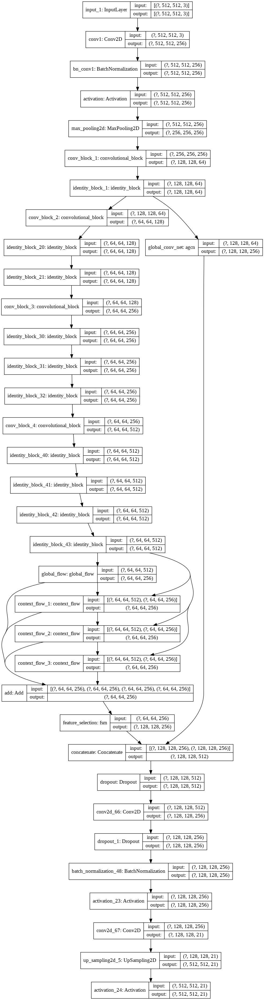

In [63]:
#getting the model plot
tf.keras.utils.plot_model(
    model_canet, to_file='model4.png', show_shapes=True, show_layer_names=True,
    rankdir='TB')

## Training CANet

In [ ]:
!rm -rf ./logs/
logdir=os.path.join("logs",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
%tensorboard --logdir $logdir

In [65]:
#defining the loss
loss = sm.losses.categorical_focal_dice_loss
#defining the optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001)
#compiling the model
model_canet.compile(optimizer, loss, metrics = [iou_score])
#defining the callbacks
cb = [tf.keras.callbacks.TensorBoard(logdir,
                                     histogram_freq = 1,
                                     write_graph = True),
      
      tf.keras.callbacks.ReduceLROnPlateau(monitor = 'val_loss',
                                           factor = 0.5,
                                           patience = 2,
                                           min_delta = 0.001),
          
      ]

In [66]:
train_data = Dataset(data_train, training = False) #removing augmentation
val_data = Dataset(data_val,training = False)

batch_size = 2
train_dataloader = DataLoader(train_data, batch_size)
val_dataloader = DataLoader(val_data, batch_size)

In [67]:
history = model_canet.fit(train_dataloader, 
                          validation_data = val_dataloader, 
                          epochs = 5, 
                          steps_per_epoch = len(train_dataloader),
                          callbacks = cb)

Epoch 1/5
1703/1703 [==============================] - 490s 288ms/step - loss: 0.7531 - iou_score: 0.2281 - val_loss: 0.9109 - val_iou_score: 0.2260 - lr: 0.0010
Epoch 2/5
1703/1703 [==============================] - 486s 285ms/step - loss: 0.6154 - iou_score: 0.3583 - val_loss: 0.6162 - val_iou_score: 0.3543 - lr: 0.0010
Epoch 3/5
1703/1703 [==============================] - 487s 286ms/step - loss: 0.6176 - iou_score: 0.3553 - val_loss: 0.6132 - val_iou_score: 0.3579 - lr: 0.0010
Epoch 4/5
1703/1703 [==============================] - 487s 286ms/step - loss: 0.5741 - iou_score: 0.3885 - val_loss: 0.6783 - val_iou_score: 0.3231 - lr: 0.0010
Epoch 5/5
1703/1703 [==============================] - 489s 287ms/step - loss: 0.6092 - iou_score: 0.3623 - val_loss: 0.6123 - val_iou_score: 0.3630 - lr: 0.0010


In [68]:
model_canet.optimizer.lr = 5e-4
model_canet.fit(train_dataloader, 
                          validation_data = val_dataloader, 
                          initial_epoch = 5,
                          epochs = 10, 
                          steps_per_epoch = len(train_dataloader),
                          callbacks = cb)

Epoch 6/10
1703/1703 [==============================] - 484s 284ms/step - loss: 0.5766 - iou_score: 0.3857 - val_loss: 0.5720 - val_iou_score: 0.3912 - lr: 5.0000e-04
Epoch 7/10
1703/1703 [==============================] - 481s 282ms/step - loss: 0.5635 - iou_score: 0.3958 - val_loss: 0.5700 - val_iou_score: 0.3936 - lr: 5.0000e-04
Epoch 8/10
1703/1703 [==============================] - 479s 281ms/step - loss: 0.5511 - iou_score: 0.4056 - val_loss: 0.5548 - val_iou_score: 0.4035 - lr: 5.0000e-04
Epoch 9/10
1703/1703 [==============================] - 480s 282ms/step - loss: 0.5433 - iou_score: 0.4118 - val_loss: 0.5387 - val_iou_score: 0.4159 - lr: 5.0000e-04
Epoch 10/10
1703/1703 [==============================] - 476s 280ms/step - loss: 0.5321 - iou_score: 0.4208 - val_loss: 0.5270 - val_iou_score: 0.4260 - lr: 5.0000e-04


## Predicting some of the validation images

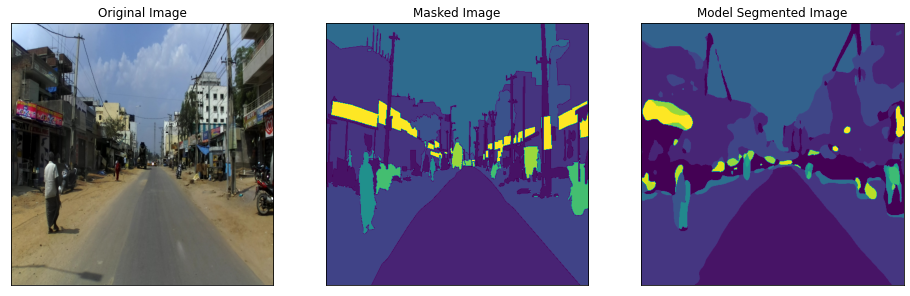

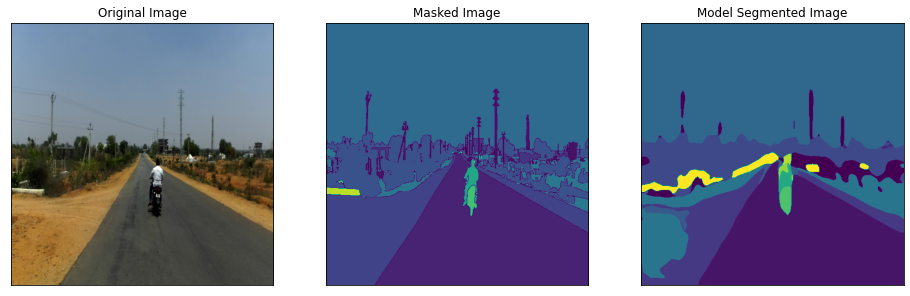

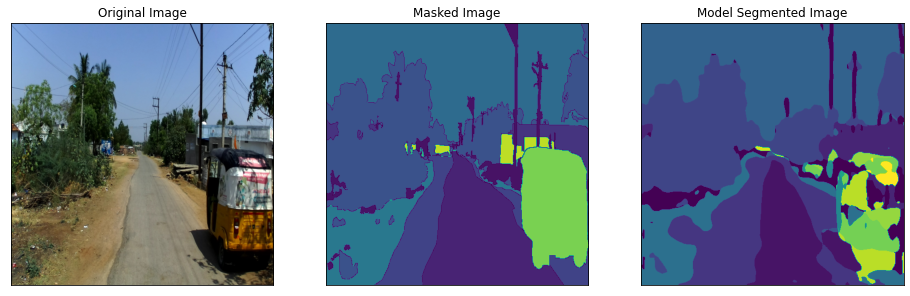

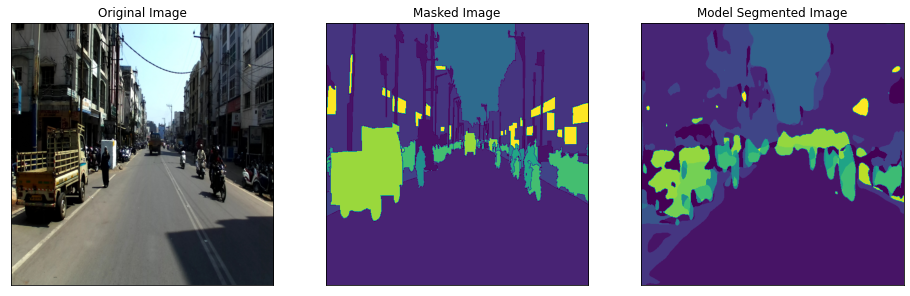

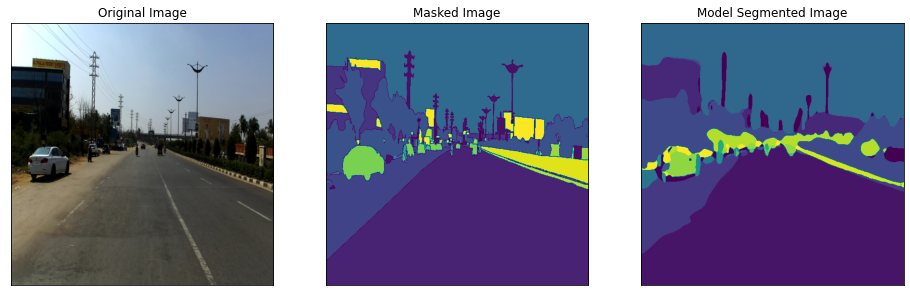

...

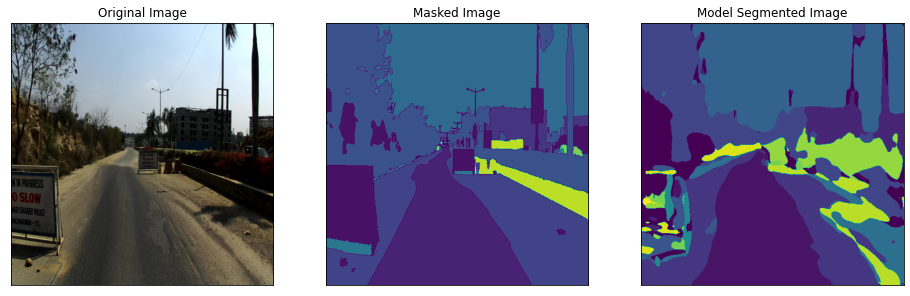

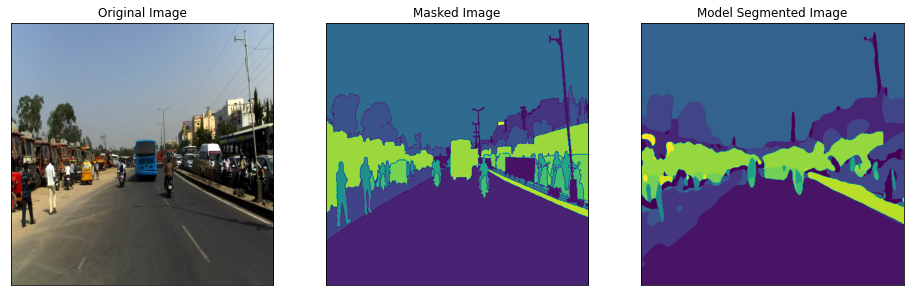

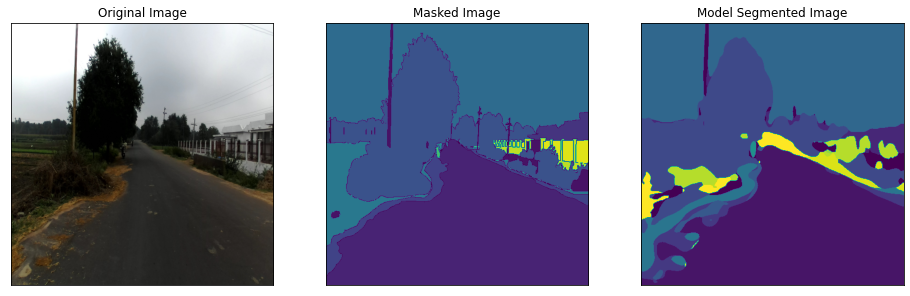

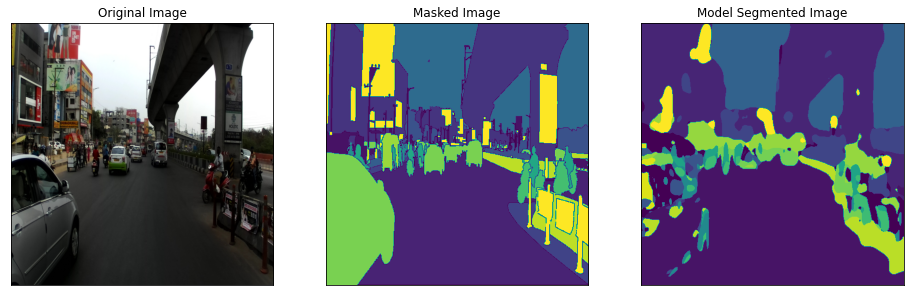

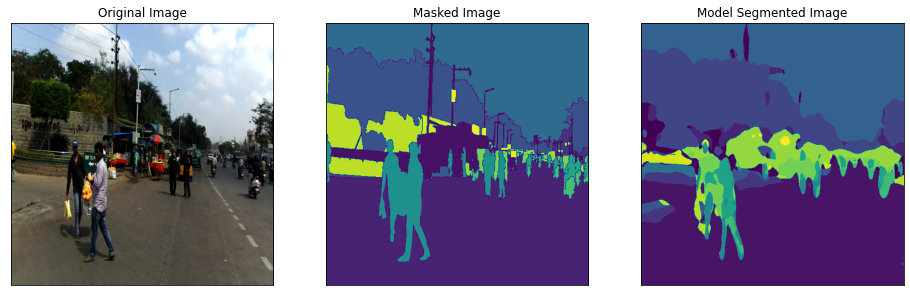

In [72]:
#plotting sampled predicted images
plot_sample_images(model_canet,20)

## TensorBoard Plots

### Epoch vs IOU Score

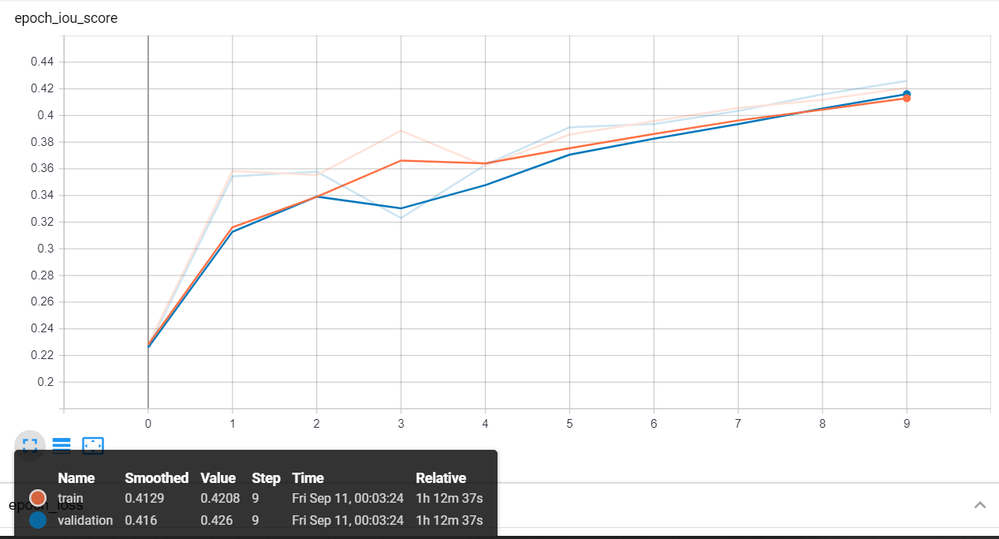

### Epoch vs Loss

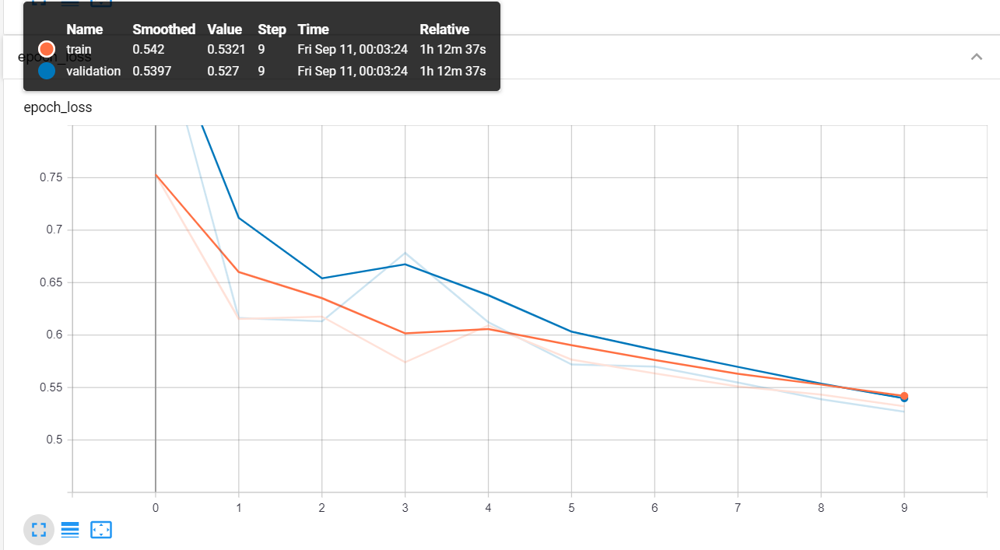

# Summary

For the task of image segmentation, we followed following steps:
<ol><li>First we created the masks of the original image, where every object was separated by filling it with different colour.
<li>There were 21 objects in total, so we had 21 different colours for masking.
<li>The mask will be helpful in calculating the loss and IOU Score as they are what we are trying to replicate/produce from the model, given an unsegmented Image.
<li>We split data into train and validation using a test size of 0.15, as we had less images.
<li>First we applied U-Net Model where the output had 21 channels, each channel for one object map. We obtained an IOU Score of 0.50.
<li>Some of the segmented images were plotted and compared with original masks, and the results seemed good.
<li>Next we used CANet Architecure, using which we got a validation IOU Score of close to 0.43. Some segmented images were plotted, but the results were not as good as U-Net.

In [3]:
from prettytable import PrettyTable

x = PrettyTable()

x.field_names = ['Model Architecure','Train Loss','Val Loss','Train IOU Score','Val IOU SCORE']
x.add_row(['U-Net', '0.4925','0.4255','0.4331','0.5028'])
x.add_row(['CANet','0.5321','0.5270','0.4208','0.4260'])
print(x)

+-------------------+------------+----------+-----------------+---------------+
| Model Architecure | Train Loss | Val Loss | Train IOU Score | Val IOU SCORE |
+-------------------+------------+----------+-----------------+---------------+
|       U-Net       |   0.4925   |  0.4255  |      0.4331     |     0.5028    |
|       CANet       |   0.5321   |  0.5270  |      0.4208     |     0.4260    |
+-------------------+------------+----------+-----------------+---------------+
